In [ ]:
% matplotlib inline

from __future__ import division

import numpy as np 
import pandas as pd 

import tweepy
# from nltk.tokenize import TweetTokenizer

import re
from collections import Counter

import json
import os

from matplotlib.pyplot import *

In [ ]:
 from colabcode import ColabCode
 ColabCode(port=10000, password="password123")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
! ls
%cd '/content/drive/My Drive/Colab Notebooks/Summer 2020/Project-X/'
! ls

drive  Miniconda3-4.5.4-Linux-x86_64.sh  rapidsai-csp-utils  sample_data
/content/drive/My Drive/Colab Notebooks/Summer 2020/Project-X
 Callbacks.ipynb			  README.md
'Model Training Logs.gdoc'		  Research
'Other notebooks'			  Tweets
'Politician Embedding Extraction.ipynb'   twitter_credentials.json
 __pycache__


In [ ]:
from fastai.text import *

data_path = Path('Tweets')
# model_path = Path(os.getcwd())
bs = 32

In [ ]:
data_lm = load_data(data_path, 'data_lm.pkl', bs = bs)
learn_lm = language_model_learner(data_lm, AWD_LSTM, drop_mult=0.3)
learn_lm.load('learn_lm_final')

In [ ]:
# reps_for_clas = ["BernieSanders", "JoeBiden", "MittRomney", "SenKamalaHarris", "SenTedCruz", 
#                  "SenWarren", "AOC", "mcuban", "mike_pence", "realDonaldTrump", "elonmusk", 
#                  "kanyewest", "BarackObama", "NYGovCuomo", "AP", "CNN"]
# df_clas = train_df.loc[train_df.rep.apply(lambda rep: rep in reps_for_clas)]

In [ ]:
data_clas = load_data(data_path, 'data_clas.pkl', bs=bs)
learn = text_classifier_learner(data_clas, AWD_LSTM, drop_mult=0.5)
learn.load_encoder('fine_tuned_enc_big')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:649: SourceChangeWarning: source code of class 'torch.nn.modules.loss.CrossEntropyLoss' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


RNNLearner(data=TextClasDataBunch;

Train: LabelList (35478 items)
x: TextList
xxbos xxmaj private equity firms are using the crisis to line their pockets . xxmaj they xxunk companies dry , kill jobs , hurt communities , and threaten our economy . i told two xxup sec nominees : we need an xxup sec with the courage to stand up to private equity and # xxunk .,xxbos xxmaj today we celebrate the 30th anniversary of the landmark xxmaj americans with xxmaj disabilities xxmaj act . xxmaj but people with disabilities are still fighting for equal opportunity and economic security . xxmaj let ’s recommit to building a truly inclusive world . # xxup ada30,xxbos xxmaj my bill to # endcorruptionnow forces anyone who submits a study to a regulator to disclose who ’s paying for it . xxmaj sham studies should be thrown out . xxmaj this is a nerdy but important way to stop xxmaj big xxmaj tech and other rich and powerful corporations from rigging the rules in their favor .,xxbos xxmaj here ’s what you 

In [ ]:
!nvidia-smi

Sat Aug  8 18:14:36 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8    12W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Adding Callbacks for Added Functionality

In [ ]:
! pip install fastcore

In [ ]:
from fastai.callbacks import *
# from fastai.callbacks.tensorboard import *
from fastcore.foundation import *

In [ ]:
learn.unfreeze()
cbs = ActivationValues(learn = learn)
learn.fit_one_cycle(1, slice(1e-3/(2.6**4),1e-3), moms=(0.8,0.7), callbacks=[cbs])
learn.save('first-callable')

epoch,train_loss,valid_loss,accuracy,time
0,0.737083,0.618457,0.800101,01:22


In [ ]:
learn.activation_stats.hist_layer_stats(2)

AttributeError: ignored

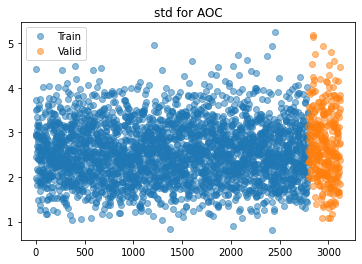

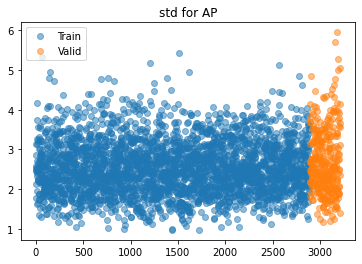

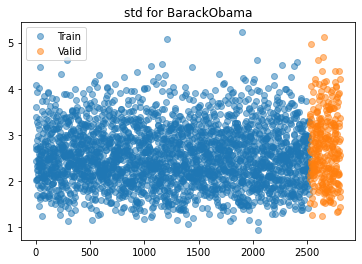

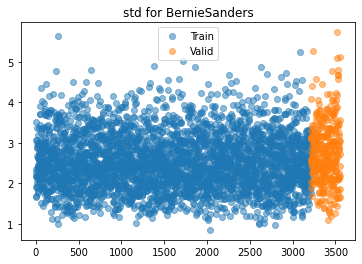

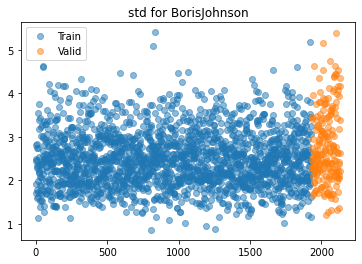

...

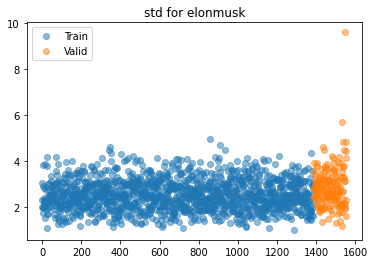

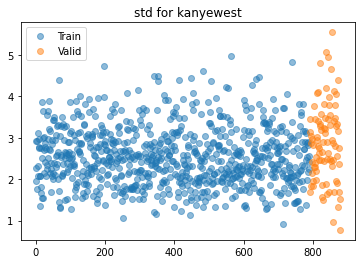

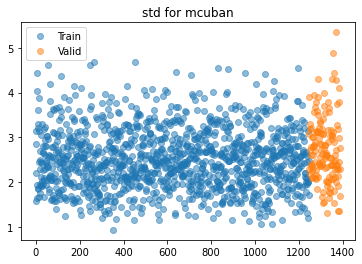

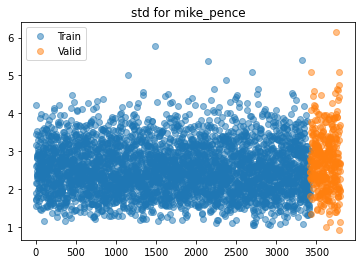

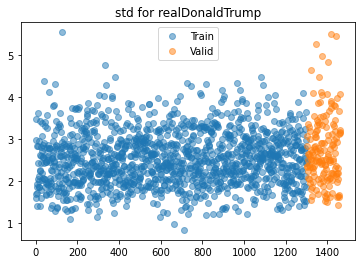

In [ ]:
learn.activation_stats.plot_layer_stats_by_rep(3, 'std')

# Callback Functions

In [ ]:
class HookCallbackClass(LearnerCallback):
    "Callback that can be used to register hooks on `modules`. Implement the corresponding function in `self.hook`."
    def __init__(self, learn:Learner, modules:Sequence[nn.Module]=None, do_remove:bool=True):
        super().__init__(learn)
        self.modules, self.do_remove = modules, do_remove

    def on_train_begin(self, **kwargs):
        "Register the `Hooks` on `self.modules`."
        if not self.modules:
            self.modules = [m for m in flatten_model(self.model[1]) if has_params(m)]
        self.hooks = Hooks(self.modules, self.hook)

    def on_train_end(self, **kwargs):
        "Remove the `Hooks`."
        if self.do_remove: self.remove()

    def remove(self): 
        if getattr(self, 'hooks', None): self.hooks.remove()
        
    def __del__(self): self.remove()

In [ ]:
class ActivationStats(HookCallbackClass):
    "Callback that record the mean and std of activations."
    def __init__(self, learn, **kwargs):
        super().__init__(learn, **kwargs)

        if learn.data.valid_dl is None:
          valid_y = torch.tensor([]) 
        else:
           valid_y = torch.tensor([learn.data.valid_dl.y.items])

        self.train_y = torch.tensor([learn.data.train_dl.y.items])
        self.valid_y = valid_y
        self.classes = learn.data.y.classes
        self.with_hist = True
        self.bs = learn.data.batch_size
        self.in_train_ls = torch.tensor([], device='cuda:0')
        self.mean, self.std, self.near_zero, self.non_zero_mean = dict(), dict(), dict(), dict()

    def on_train_begin(self, **kwargs):
        "Initialize stats."
        super().on_train_begin(**kwargs)
        for m,_ in enumerate(self.modules):
            self.mean.update({m:torch.tensor([], device='cuda:0')})
            self.std.update({m:torch.tensor([], device='cuda:0')})
            self.near_zero.update({m:torch.tensor([], device='cuda:0')})
            self.non_zero_mean.update({m:torch.tensor([], device='cuda:0')})

    def hook(self, m, i, o):
        o = o.float()
        o_non_zero = torch.tensor([row[torch.abs(row)>0.005].mean() for row in o], device='cuda:0')

        res = {'mean': o.mean(1), 'std': o.std(1),
               'near_zero': (torch.abs(o)<=0.005).float().mean(1),
               'non_zero_mean': o_non_zero}

        if self.with_hist: res['hist'] = o.histc(40,0,10)
        return res

    def on_batch_end(self, train, **kwargs):
        "Take the stored results and puts it in `self.stats`"

        zeros_or_ones = torch.ones(self.hooks.stored[0]['mean'].__len__(), device='cuda:0') if train else torch.zeros(self.hooks.stored[0]['mean'].__len__(), device='cuda:0')
        self.in_train_ls = torch.cat([self.in_train_ls, zeros_or_ones])

        for i in np.arange(len(self.modules)):
            self.mean[i]      = torch.cat([self.mean[i],     self.hooks.stored[i]['mean']])
            self.std[i]       = torch.cat([self.std[i],      self.hooks.stored[i]['std']])
            self.near_zero[i] = torch.cat([self.near_zero[i],self.hooks.stored[i]['near_zero']])
            self.non_zero_mean[i] = torch.cat([self.non_zero_mean[i],self.hooks.stored[i]['non_zero_mean']])

        super().on_batch_end(**kwargs)

    def on_train_end(self, **kwargs):
        "Convert to Dictionary."
        self.stats = {'means': self.mean, 'std': self.std, 'near_zero': self.near_zero, 'non_zero_mean': self.non_zero_mean}

        target = torch.zeros(len(self.train_y))
        source = torch.ones(len(self.train_y)-len(self.train_y)%self.bs)
        target[:len(source)] = source

        self.y = torch.cat([self.train_y[target==1], self.valid_y], dim=1).squeeze()

        super().on_train_end(**kwargs)
        
    def layer_stats(self, idx):
        lstats = {'mean':self.mean[idx], 'std': self.std[idx], 'near_zero': self.near_zero[idx], 'non_zero_mean': self.non_zero_mean[idx]}
        return lstats
    
    def hist_layer_stats(self, idx):
        for key, value in self.stats.items():
            hist_data = pd.Series(value[idx].cpu())
            hist_data.plot.hist(grid=True, bins=10, rwidth=0.9,
                              color='#607c8e')
            plt.title('Histogram of Layer Activations '+key)
            plt.xlabel(key)
            plt.ylabel('Count')
            plt.grid(axis='y', alpha=0.75)
            plt.show()

    def plot_layer_stats(self, idx):
        for key, value in self.stats.items():
            plt_data = pd.Series(value[idx].cpu())
            plt_data.plot(grid=True, color='#607c8e')
            plt.title('Plot of Layer Activations '+key)
            plt.xlabel('')
            plt.ylabel(key)
            plt.grid(axis='y', alpha=0.75)
            plt.show()

    def plot_layer_stats_by_rep(self, idx, key):
        for i, name in enumerate(self.classes):
            value = self.stats[key]
            in_train_id = self.in_train_ls.cpu()

            df = pd.DataFrame()
            df['reps'] = self.y[self.target==1].int()
            df['train'] = ["Train" if iter == 1 else "Valid" for iter in in_train_id]
            df[key] = value[idx].cpu()
            df['reps'] = df['reps'].astype('category')

            df = df.loc[df['reps']==i,:]
            df = df.reset_index(drop=True)

            groups = df.groupby("train")
            for group_name, group in groups:
                plt.plot(group.index, group[key], marker="o", linestyle="", label=group_name, alpha = 0.5)
                plt.title(key + " for " + name)
                plt.legend()
            plt.show()

In [ ]:
class ActivationValues(HookCallbackClass):
    "Callback that record activation for final layer"
    def __init__(self, learn, **kwargs):
        super().__init__(learn, **kwargs)

        if learn.data.valid_dl is None:
          valid_y = torch.tensor([]) 
        else:
          valid_y = torch.tensor([learn.data.valid_dl.y.items])

        self.train_y = torch.tensor([learn.data.train_dl.y.items])
        self.valid_y = valid_y
        self.bs = learn.data.batch_size
        self.outputs = torch.tensor([], device='cuda:0')
        
    def on_train_begin(self, **kwargs):
        super().on_train_begin(**kwargs)
        self.last_module = self.modules[-1]
            
    def hook(self, m, i, o):
        if m == self.last_module:
            o = o.float()
            res = {'outputs': o}
            return res

    def on_batch_end(self, train, **kwargs):
        "Take the stored results and puts it in `self.stats`"
        self.outputs = torch.cat([self.outputs, self.hooks.stored[-1]['outputs']], dim = 0)

        super().on_batch_end(**kwargs)

    def on_train_end(self, **kwargs):
        "Convert to Dictionary."
        self.stats = {'outputs': self.outputs}
        
        target = torch.zeros(len(self.train_y.squeeze(0)))
        source = torch.ones(len(self.train_y.squeeze(0))-len(self.train_y.squeeze(0))%self.bs)
        target[:len(source)] = source

        self.y = torch.cat([self.train_y.squeeze()[(target==1)], self.valid_y.squeeze()], dim=0)

        super().on_train_end(**kwargs)



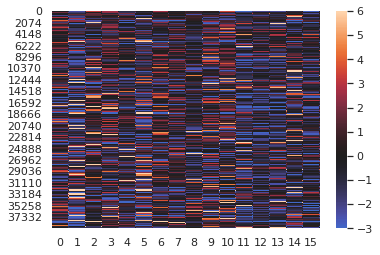

In [ ]:
import seaborn as sns; sns.set()
ax = sns.heatmap(learn.activation_values.outputs.cpu(), center=0, vmin=-3, vmax=6)

In [ ]:
# Reset Runtime until we get the right type of GPU

import pynvml
pynvml.nvmlInit()
handle = pynvml.nvmlDeviceGetHandleByIndex(0)
device_name = pynvml.nvmlDeviceGetName(handle)
if (device_name != b'Tesla T4') and (device_name != b'Tesla P4') and (device_name != b'Tesla P100-PCIE-16GB'):
  raise Exception("Unfortunately this instance does not have a T4, P4 or P100 GPU.")
else:
  print('Woo! You got the right kind of GPU!')

Woo! You got the right kind of GPU!


In [ ]:
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git

# install RAPIDS
!bash rapidsai-csp-utils/colab/rapids-colab.sh

import sys, os
# set necessary environment variables 
dist_package_index = sys.path.index('/usr/local/lib/python3.6/dist-packages')
sys.path = sys.path[:dist_package_index] + ['/usr/local/lib/python3.6/site-packages'] + sys.path[dist_package_index:]
sys.path

# update pyarrow & modules 
# exec(open('rapidsai-csp-utils/colab/update_modules.py').read(), globals())

Cloning into 'rapidsai-csp-utils'...
remote: Enumerating objects: 165, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (160/160), done.
remote: Total 165 (delta 60), reused 20 (delta 4), pack-reused 0
Receiving objects: 100% (165/165), 48.48 KiB | 6.93 MiB/s, done.
Resolving deltas: 100% (60/60), done.
PLEASE READ
********************************************************************************************************
Changes:
1. Default stable version is now 0.14.  Nightly is now 0.15.  We have fixed the long conda install.  Hooray!
2. You can now declare your RAPIDSAI version as a CLI option and skip the user prompts (ex: '0.14' or '0.15', between 0.13 to 0.15, without the quotes): 
        "!bash rapidsai-csp-utils/colab/rapids-colab.sh <version/label>"
        Examples: '!bash rapidsai-csp-utils/colab/rapids-colab.sh 0.14', or '!bash rapidsai-csp-utils/colab/rapids-colab.sh stable', or '!bash rapidsai-csp-utils/colab/rapids-colab.sh s'
       

['',
 '/env/python',
 '/usr/lib/python36.zip',
 '/usr/lib/python3.6',
 '/usr/lib/python3.6/lib-dynload',
 '/usr/local/lib/python3.6/site-packages',
 '/usr/local/lib/python3.6/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.6/dist-packages/IPython/extensions',
 '/root/.ipython']

In [ ]:
learn.load('first-callable')

RNNLearner(data=TextClasDataBunch;

Train: LabelList (35478 items)
x: TextList
xxbos xxmaj private equity firms are using the crisis to line their pockets . xxmaj they xxunk companies dry , kill jobs , hurt communities , and threaten our economy . i told two xxup sec nominees : we need an xxup sec with the courage to stand up to private equity and # xxunk .,xxbos xxmaj today we celebrate the 30th anniversary of the landmark xxmaj americans with xxmaj disabilities xxmaj act . xxmaj but people with disabilities are still fighting for equal opportunity and economic security . xxmaj let ’s recommit to building a truly inclusive world . # xxup ada30,xxbos xxmaj my bill to # endcorruptionnow forces anyone who submits a study to a regulator to disclose who ’s paying for it . xxmaj sham studies should be thrown out . xxmaj this is a nerdy but important way to stop xxmaj big xxmaj tech and other rich and powerful corporations from rigging the rules in their favor .,xxbos xxmaj here ’s what you 

In [ ]:
from cuml.manifold import TSNE

In [ ]:
colours = ['#00008b', '#00ae00','#4a2d9f', '#7255b2', '#92000a', '#009c00', '#ab3d2e', '#c16554','#977dc6', '#d58b7c', '#baa7d9', '#bebebe', '#bfc1c2', '#b3b3b3', '#5a433f', '#611009']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 26.765883684158325 seconds


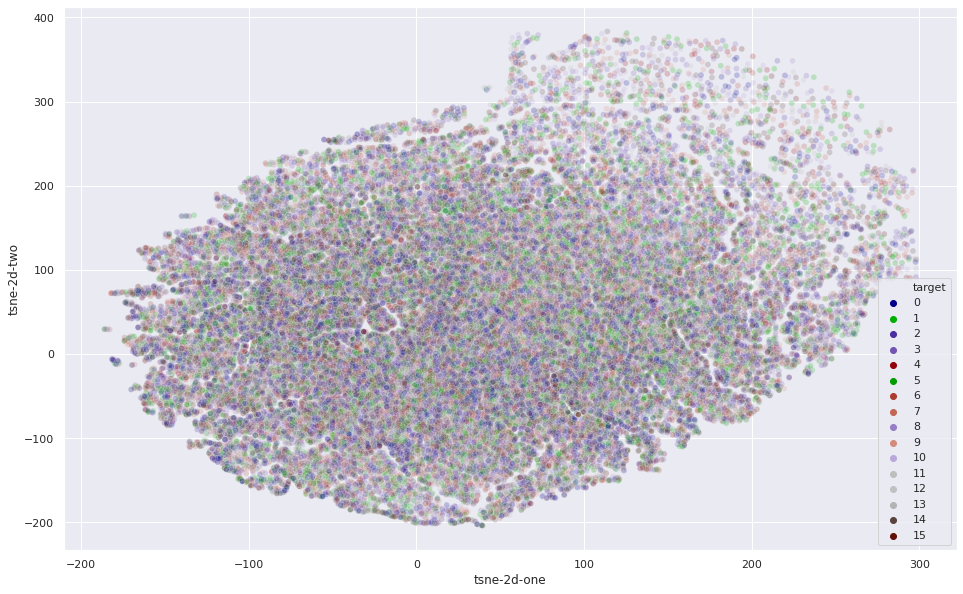

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=5, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.67698073387146 seconds


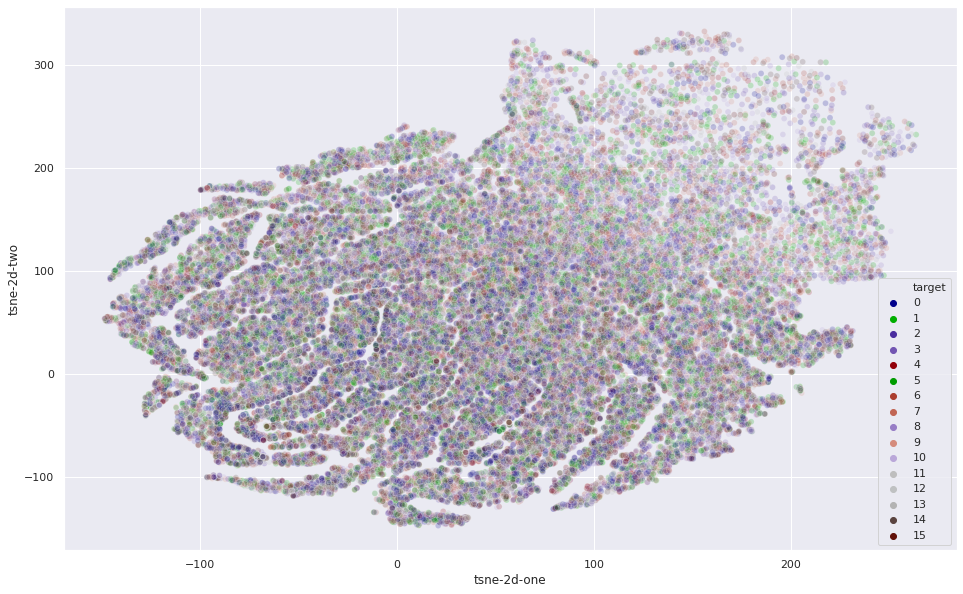

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.91790246963501 seconds


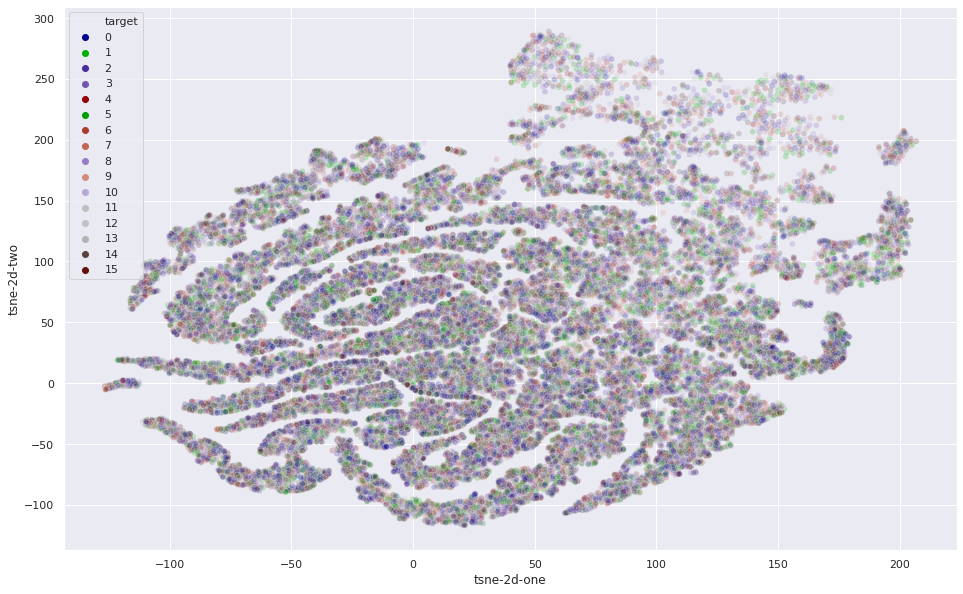

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=20, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.375797986984253 seconds


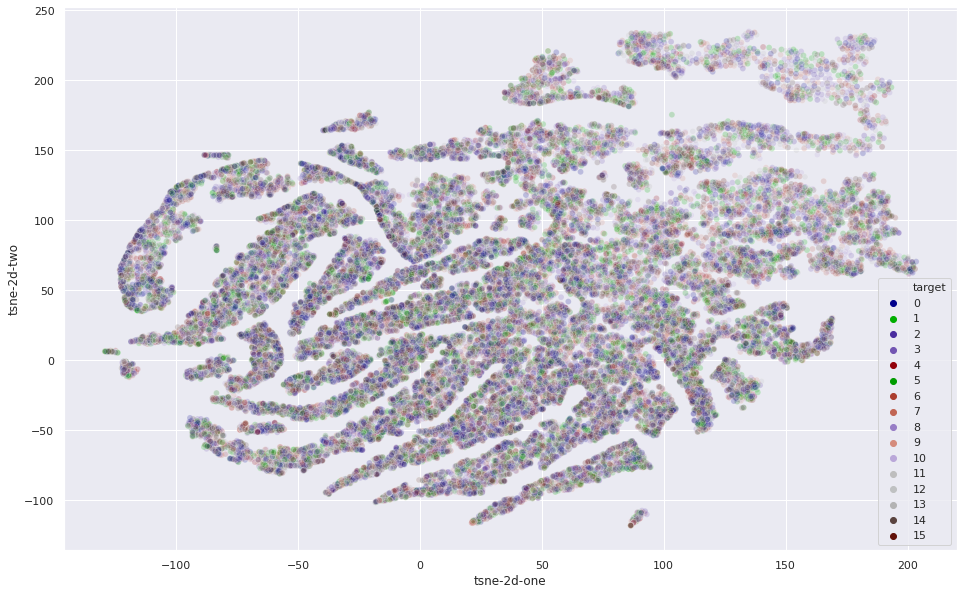

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=25, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.409578561782837 seconds


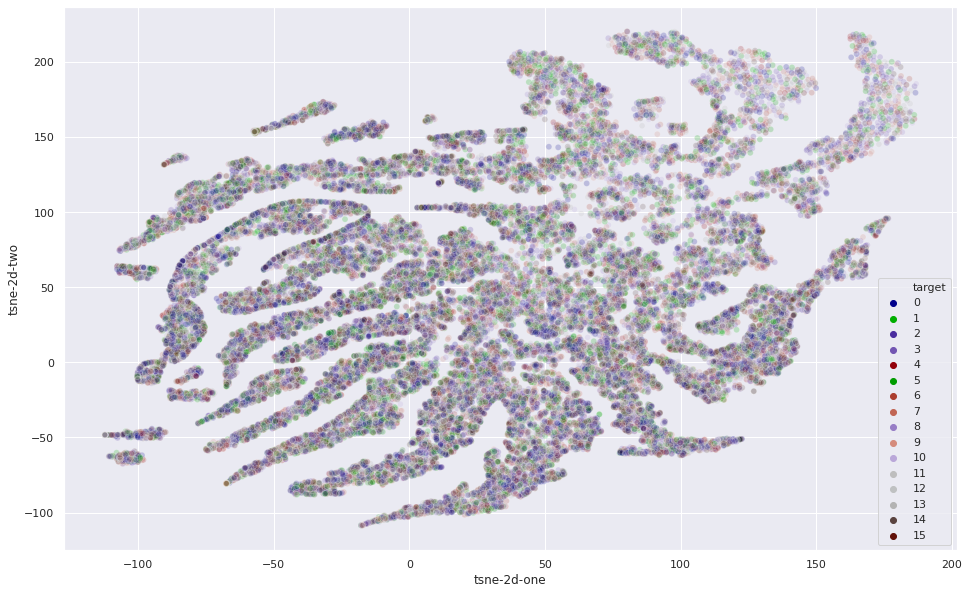

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 24.485084295272827 seconds


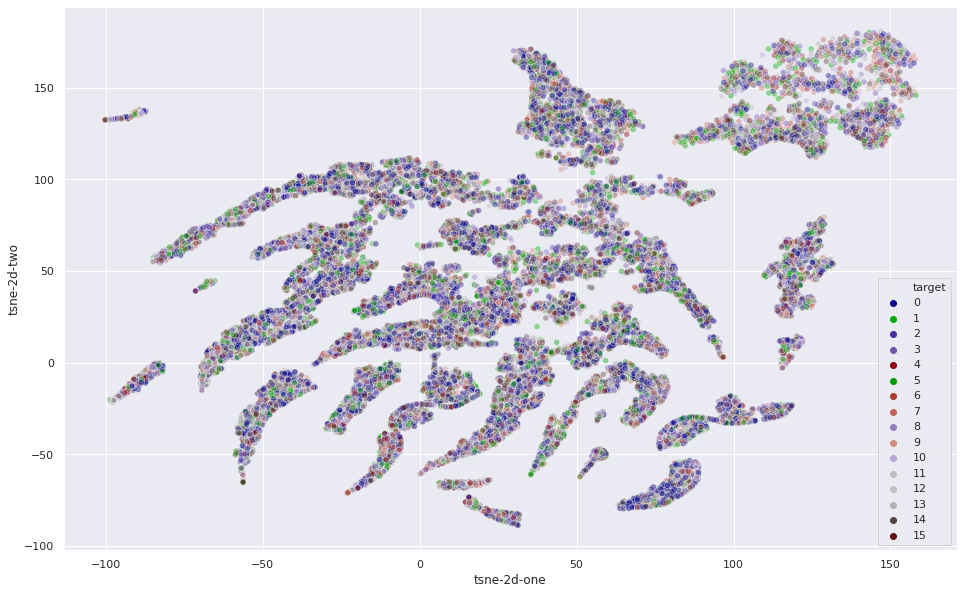

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.4,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.616159200668335 seconds


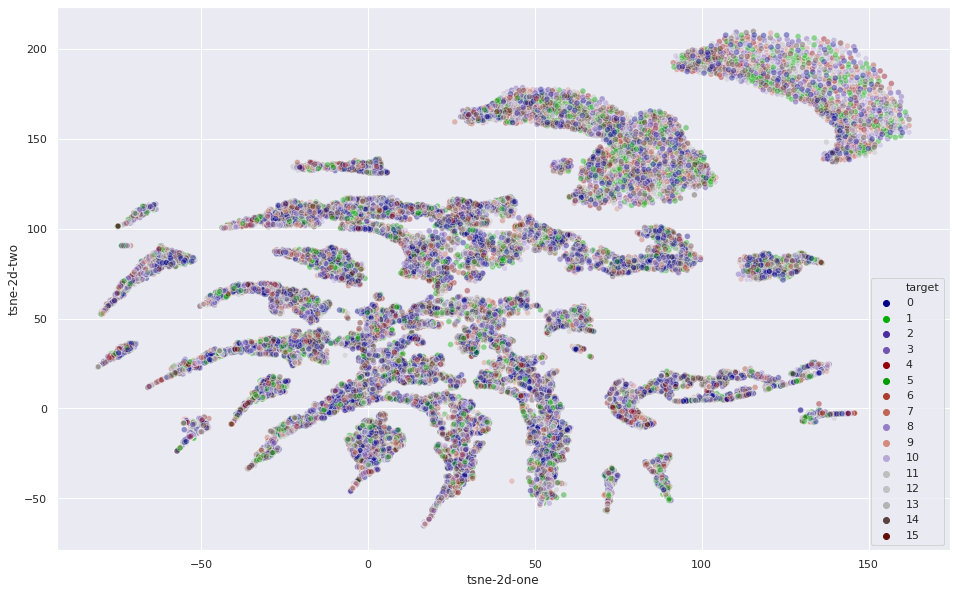

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=200, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.670803785324097 seconds


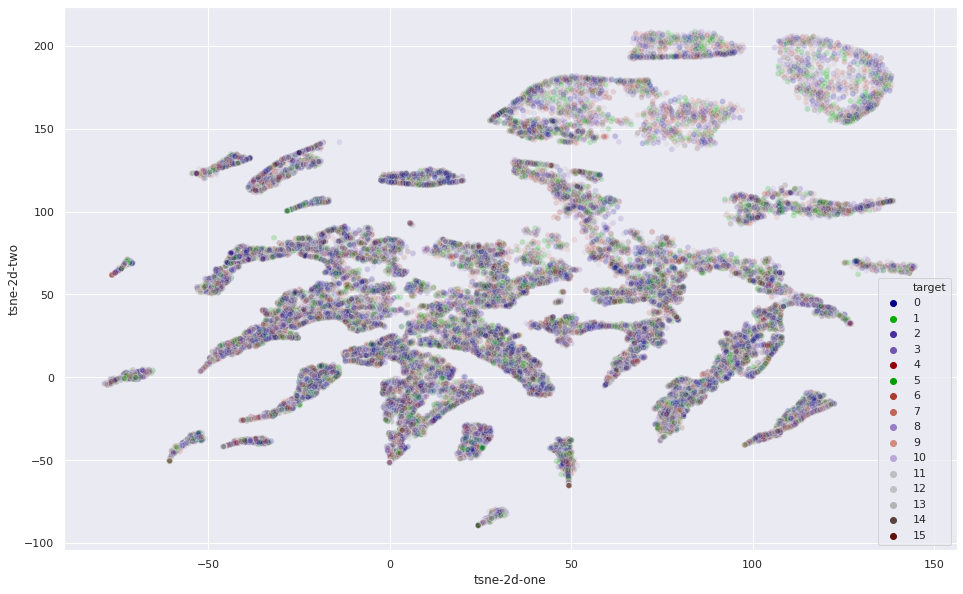

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=300, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.124417781829834 seconds


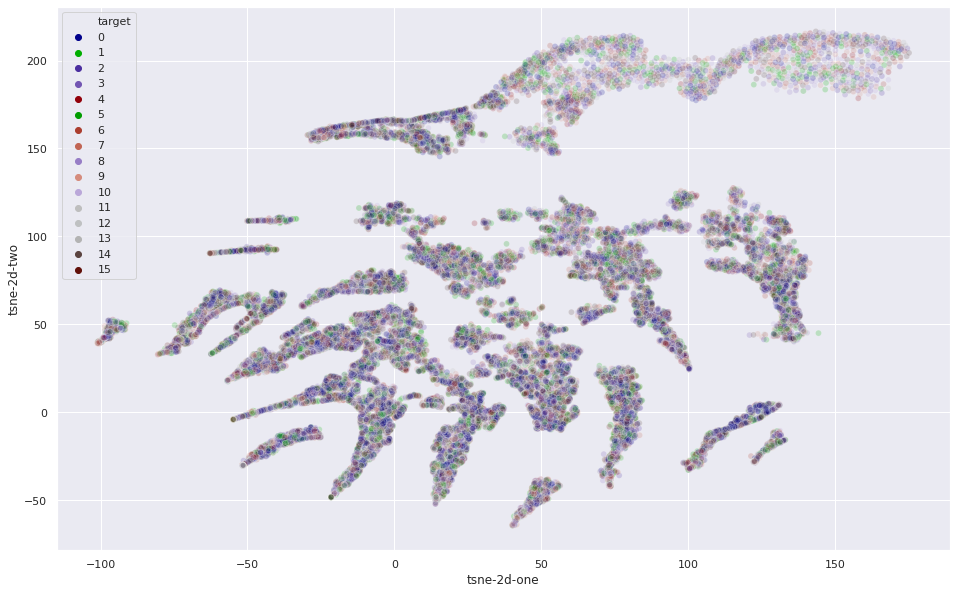

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=500, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.465996503829956 seconds


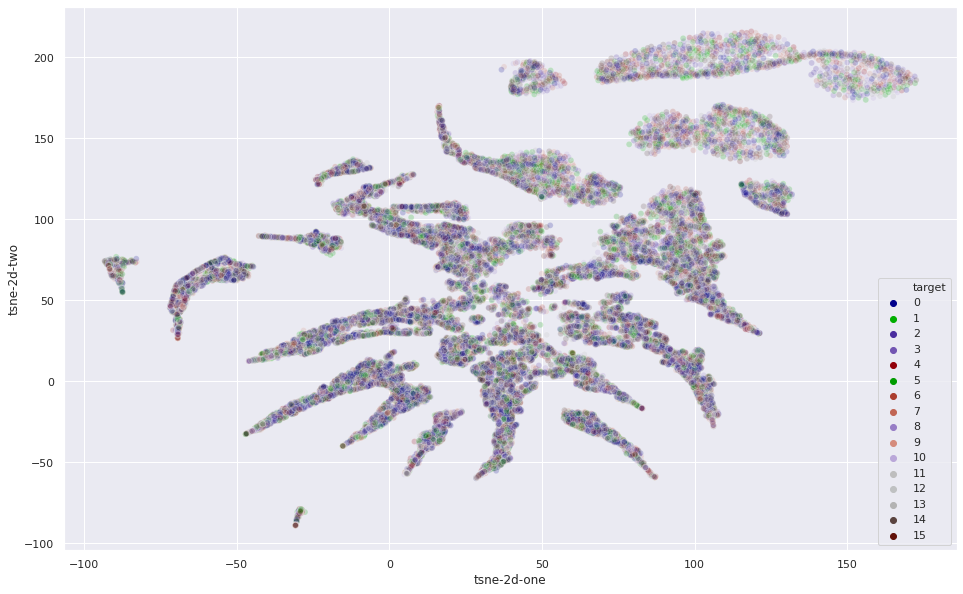

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=800, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.024968147277832 seconds


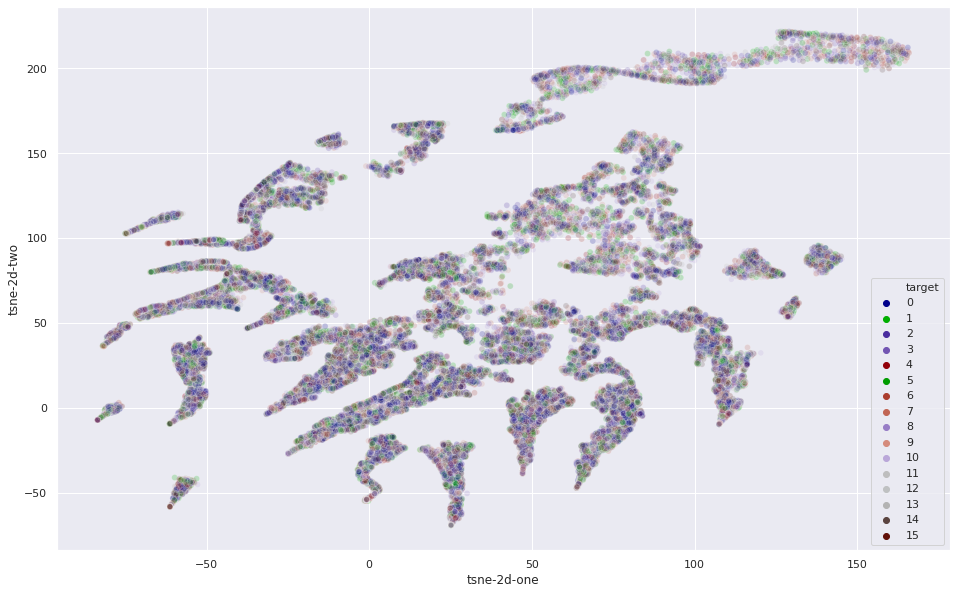

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=1000, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.15014123916626 seconds


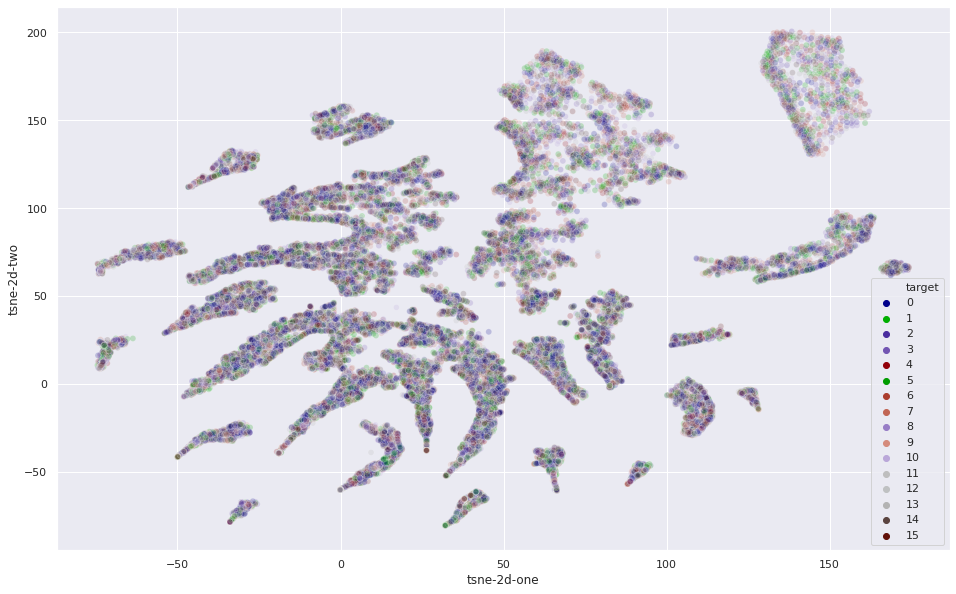

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=1200, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.322582960128784 seconds


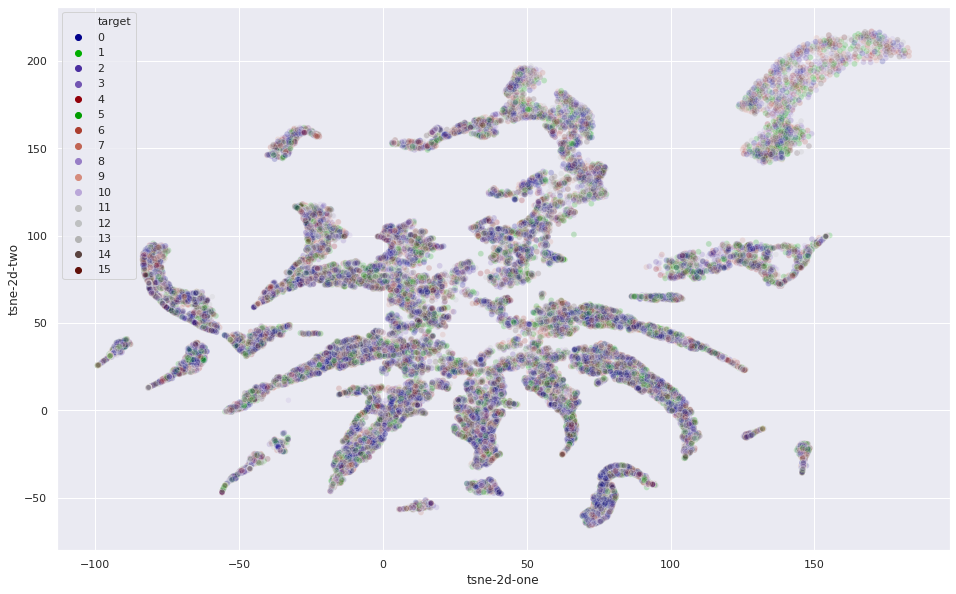

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=1500, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 25.441619396209717 seconds


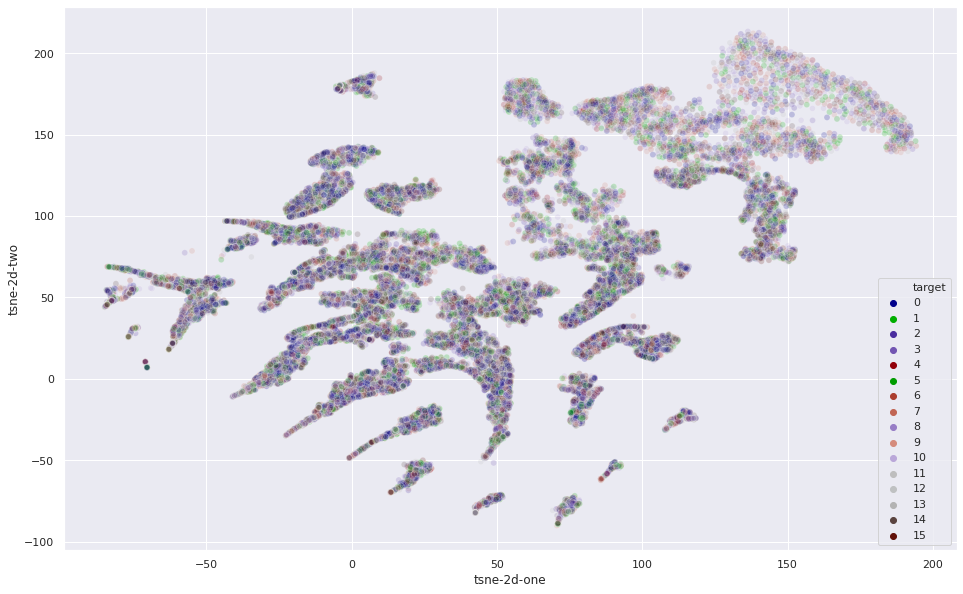

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=1700, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 49.169410705566406 seconds


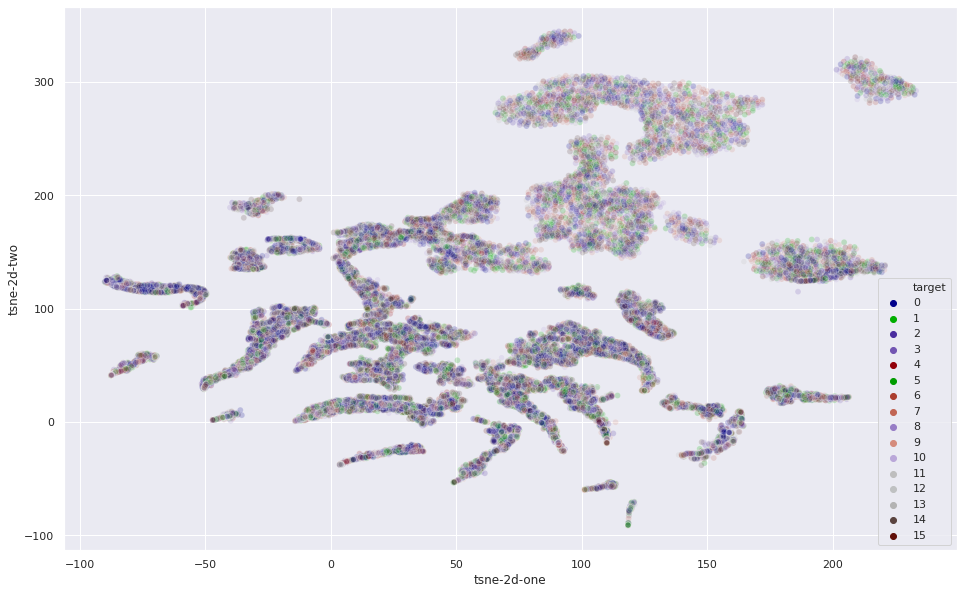

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=2000, n_iter=20000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


t-SNE done! Time elapsed: 49.382354497909546 seconds


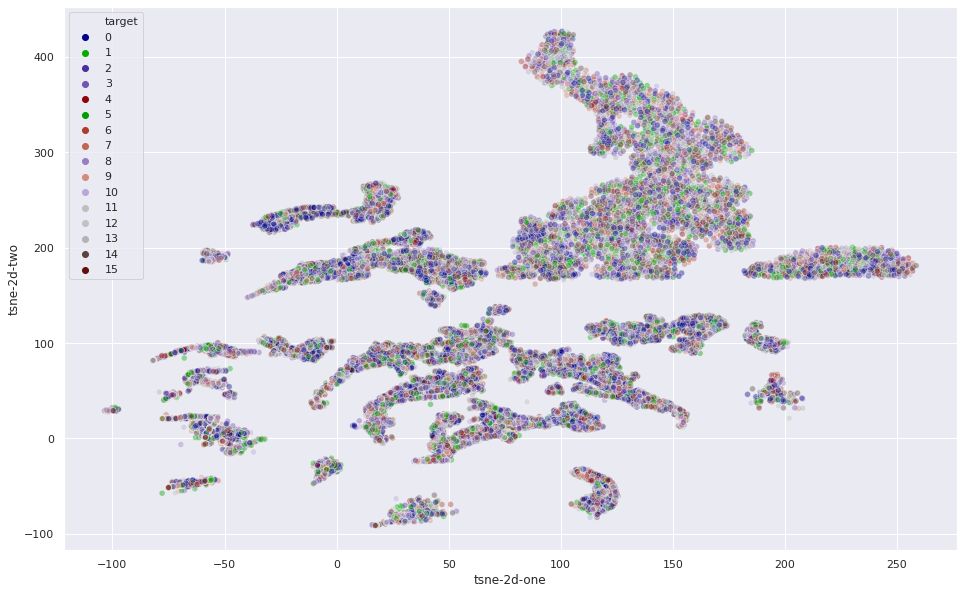

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=3000, n_iter=20000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.4,
    legend="full",
    hue='target'
)

t-SNE done! Time elapsed: 61.501731395721436 seconds


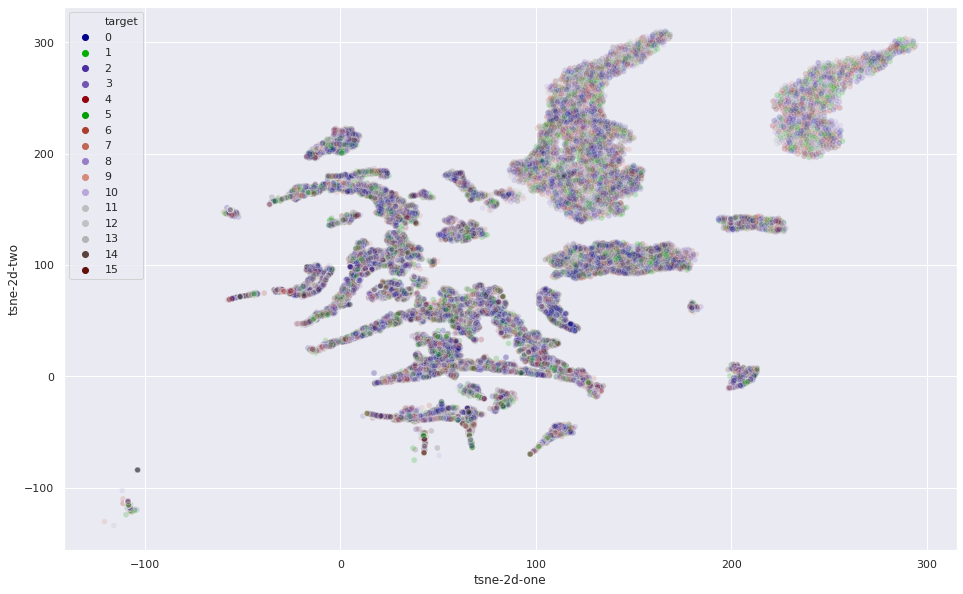

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=4000, n_iter=25000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs, dim=1))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

t-SNE done! Time elapsed: 60.93797993659973 seconds


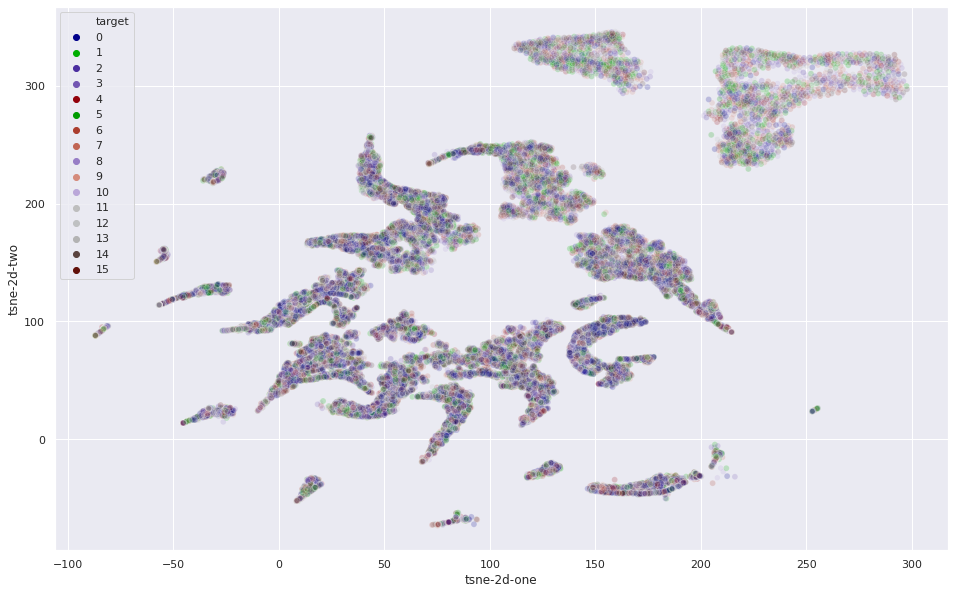

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=4500, n_iter=25000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs, dim=1))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

t-SNE done! Time elapsed: 25.15596079826355 seconds


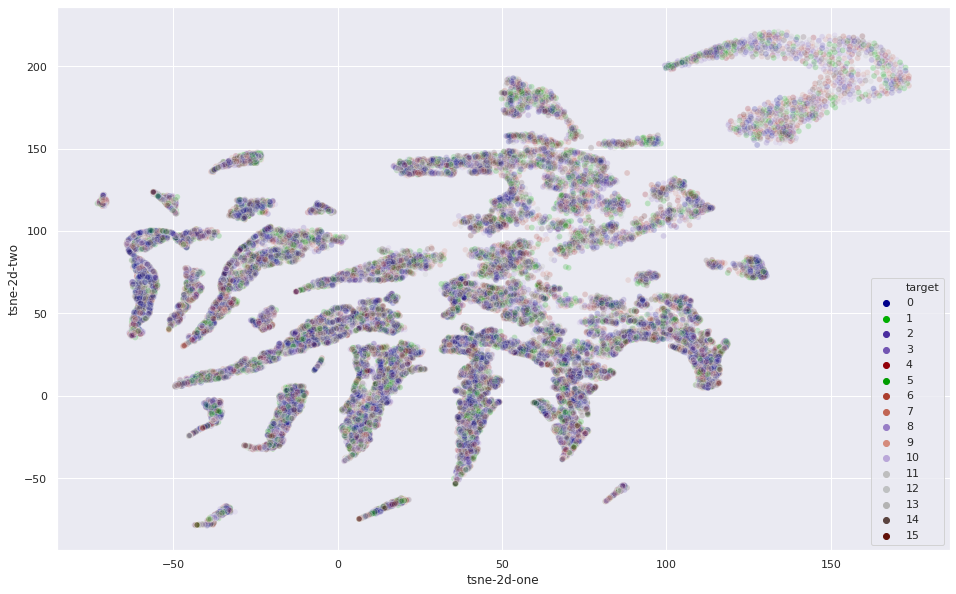

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=15000, n_iter=10000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs, dim=1))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

t-SNE done! Time elapsed: 144.85748600959778 seconds


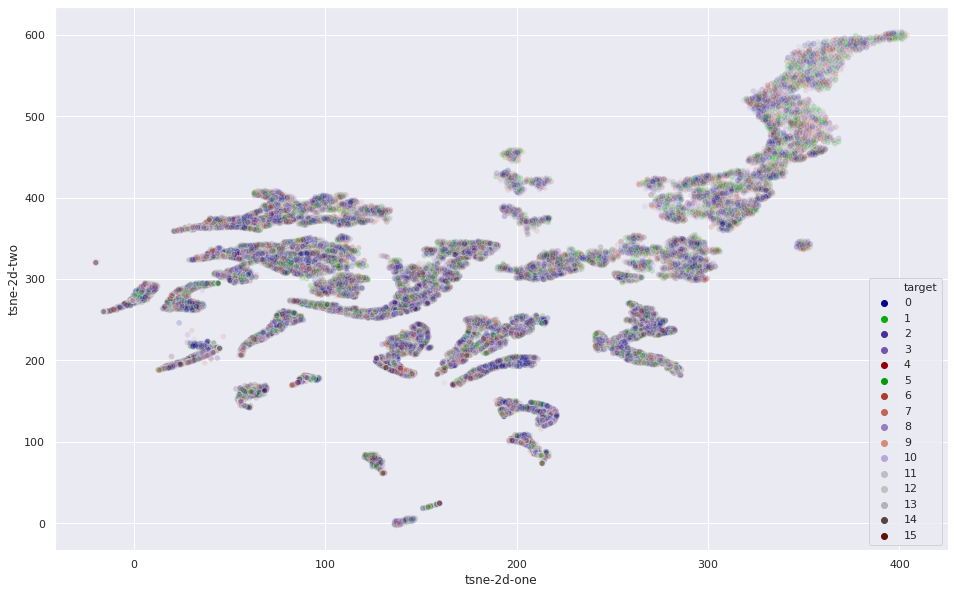

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=30000, n_iter=60000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs, dim=1))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

t-SNE done! Time elapsed: 75.74932789802551 seconds


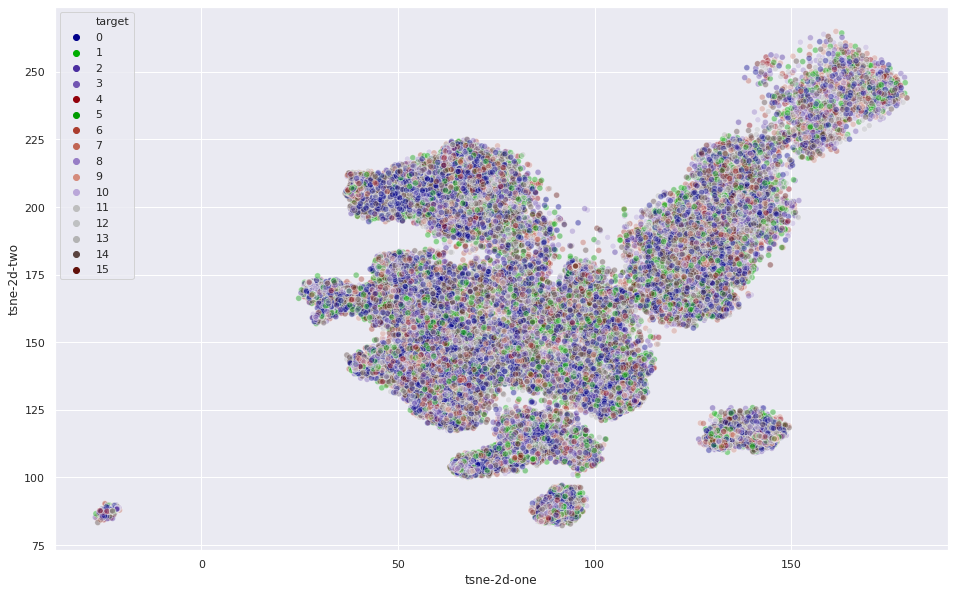

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=5500, n_iter=25000)
tsne_results = tsne.fit_transform(F.softmax(learn.activation_values.outputs, dim=1))

tsneDf = pd.DataFrame(data = tsne_results
             , columns = ['tsne-2d-one', 'tsne-2d-two'])

tsneDf = pd.concat([tsneDf, pd.Series(learn.activation_values.y.tolist())], axis = 1)
tsneDf.columns = ['tsne-2d-one', 'tsne-2d-two', 'target']

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

tsneDf.target=tsneDf.target.astype('category')

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    palette=sns.set_palette(sns.color_palette(colours)),
    data=tsneDf,
    alpha=0.2,
    legend="full",
    hue='target'
)

In [ ]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

  Created wheel for gputil: filename=GPUtil-1.4.0-cp36-none-any.whl size=7413 sha256=3a8bc14fbf625d156103d43a612c1fcb2d4c763532f9a7eccfdfe5310c67cf95
  Stored in directory: /root/.cache/pip/wheels/3d/77/07/80562de4bb0786e5ea186911a2c831fdd0018bda69beab71fd
Successfully built gputil
Gen RAM Free: 10.3 GB  | Proc size: 3.9 GB
GPU RAM Free: 6846MB | Used: 8233MB | Util  55% | Total 15079MB
